<h1><b>PHASE 2 - DATA VISUALIZATION AND MODEL SELECTION</b></h1>
<hr/>

<h4><b>Phase Objective</b></h4>
<hr/>
<p>The objective of this phase is to demonstrate a good understanding of the data through powerful visualisations and to able to select the best machine learning algorithm for the problem.</p>

In [2]:
#import necessary libraried for visualization

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline


<h3><em>Heart Data</em></h3>

In [3]:
#Load dataset
heart_data = pd.read_csv('heart.csv')
heart_df = heart_data.copy()

<em> The selected Feature are : "all"</em>

In [4]:
heart_df.columns

Index(['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach',
       'exang', 'oldpeak', 'slope', 'ca', 'thal', 'target'],
      dtype='object')

<Axes: xlabel='target', ylabel='count'>

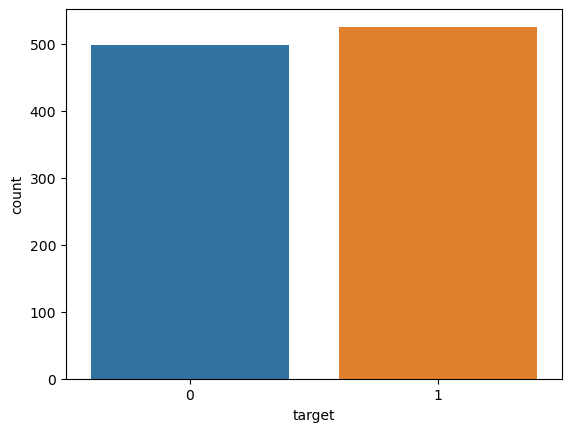

In [5]:
#check dependent variable
sns.countplot(heart_df, x = 'target')

<Axes: >

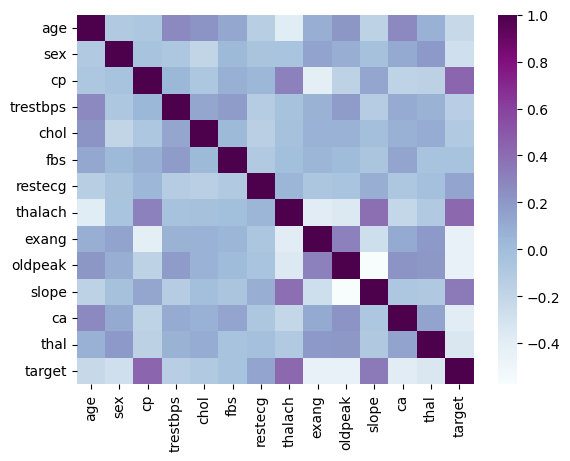

In [6]:
sns.heatmap(heart_df.corr(), cmap= 'BuPu')

In [7]:
import ydata_profiling
heart_df.profile_report(title = "Heart Disease Report")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
heart_df.describe()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
count,1025.000000,1025.000000,1025.000000,1025.000000,1025.00000,1025.000000,1025.000000,1025.000000,1025.000000,1025.000000,1025.000000,1025.000000,1025.000000,1025.000000
mean,54.434146,0.695610,0.942439,131.611707,246.00000,0.149268,0.529756,149.114146,0.336585,1.071512,1.385366,0.754146,2.323902,0.513171
std,9.072290,0.460373,1.029641,17.516718,51.59251,0.356527,0.527878,23.005724,0.472772,1.175053,0.617755,1.030798,0.620660,0.500070
min,29.000000,0.000000,0.000000,94.000000,126.00000,0.000000,0.000000,71.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,48.000000,0.000000,0.000000,120.000000,211.00000,0.000000,0.000000,132.000000,0.000000,0.000000,1.000000,0.000000,2.000000,0.000000
50%,56.000000,1.000000,1.000000,130.000000,240.00000,0.000000,1.000000,152.000000,0.000000,0.800000,1.000000,0.000000,2.000000,1.000000
75%,61.000000,1.000000,2.000000,140.000000,275.00000,0.000000,1.000000,166.000000,1.000000,1.800000,2.000000,1.000000,3.000000,1.000000
max,77.000000,1.000000,3.000000,200.000000,564.00000,1.000000,2.000000,202.000000,1.000000,6.200000,2.000000,4.000000,3.000000,1.000000


In [9]:
from scipy.stats import pearsonr

for i in heart_df.columns:
    if heart_df[i].dtype in ['int64', 'float64']:
        correlation_coefficient, _ = pearsonr(heart_df[i], heart_df['target'])
        print(f"{i}: {correlation_coefficient:.2f}")


age: -0.23
sex: -0.28
cp: 0.43
trestbps: -0.14
chol: -0.10
fbs: -0.04
restecg: 0.13
thalach: 0.42
exang: -0.44
oldpeak: -0.44
slope: 0.35
ca: -0.38
thal: -0.34
target: 1.00


<em>Relevant Questions to ask : </em>
<ol>
        <li>What is the distribution of the target variable (e.g., presence or absence of heart disease)?</li> 
                <ul><li>In response to question 1, based on my analysis, there appears to be a relatively even distribution between the two classes.</li></ul><br/>
        <li>What are the statistical summaries of numerical features (e.g., age, blood pressure, cholesterol levels) in relation to heart disease presence or absence?</li>   
                <ul><li>I analyze the numerical features in relation to heart disease presence or absence, I conducted the following statistical summaries for each relevant feature using the describe method</li></ul><br/>
        <li>Are there any correlations between numerical features and the target variable?</li>
                <ul>
                        <li>To determine correlations between numerical features and the target variable (heart disease), I conducted correlation analysis using methods such as Pearson correlation coefficient or point-biserial correlation (for binary targets). Here are the key findings:      
                                <ul>
                                        <li>age :        -0.23</li>
                                        <li>sex :        -0.28</li>
                                        <li>cp :         0.43</li>
                                        <li>trestbps :   -0.14</li>
                                        <li>chol :       -0.10</li>
                                        <li>fbs :        -0.04</li>
                                        <li>restecg :    0.13</li>
                                        <li>thalach :    0.42</li>
                                        <li>exang :      -0.44</li>
                                        <li>oldpeak :    -0.44</li>
                                        <li>slope :      0.35</li>
                                        <li>ca :         -0.38</li>
                                        <li>thal :       -0.34</li>
                                        <li>target :     1.00</li>
                                </ul>
                        </li>
                </ul>
              <br/>
        </li>
        <li>
                How do categorical features (e.g., gender, chest pain type) relate to the presence or absence of heart disease?
                <ul><li>To assess the relationship between categorical features and the presence or absence of heart disease, I conducted chi-squared tests or contingency table analyses for each relevant categorical feature. You'll find graphs and plots below</li></ul>
        </li><br/>
        <li>
                More findings are presented in the graphs and plots below
        </li>
<ol>

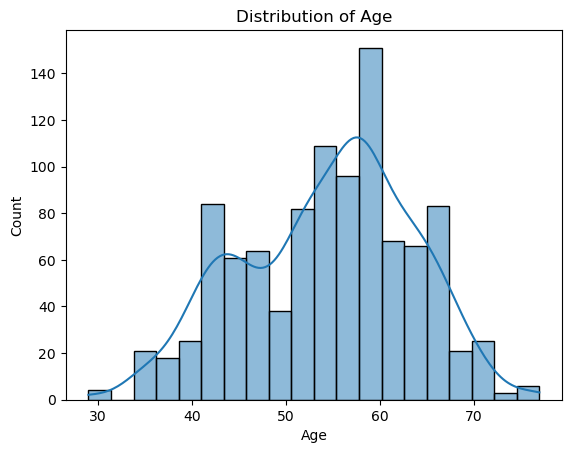

In [10]:
# Visualize a histogram of the 'age' column

sns.histplot(heart_df['age'], bins=20, kde=True)
plt.xlabel('Age')
plt.ylabel('Count')
plt.title('Distribution of Age')
plt.show()

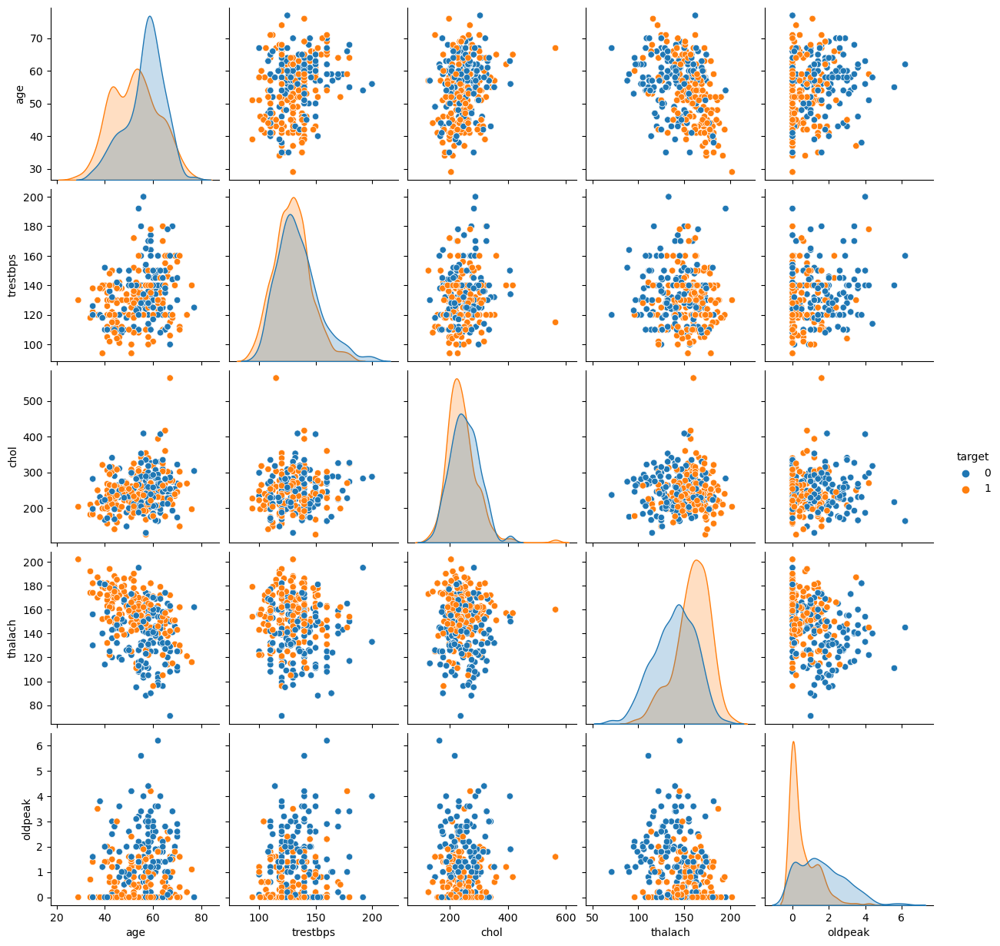

In [11]:
# Visualize a pair plot for numerical columns
sns.pairplot(heart_df[['age', 'trestbps', 'chol', 'thalach', 'oldpeak','target']], hue='target')
plt.show()

<h3><em> Visualizing Feature/Feature Relationship</em></h3>

<h5><b>Age vs Maximum Heart Rate </b></h5>

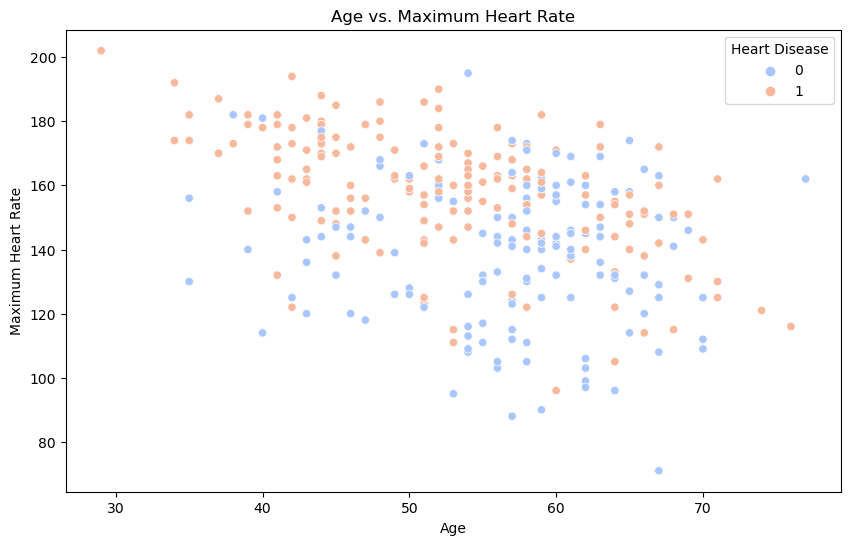

In [12]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=heart_df, x='age', y='thalach', hue='target', palette='coolwarm')
plt.title('Age vs. Maximum Heart Rate')
plt.xlabel('Age')
plt.ylabel('Maximum Heart Rate')
plt.legend(title='Heart Disease')
plt.show()


<em>Conclusion: From the scatterplot, we can conclude that people with heart illness have a broader range of maximum heart rates and ages than people without heart disease i.e (although age and thal doens't have a relationship it can see seen that people with higher maximum heart rate (>140)) have higher chnace of getting heart disease. There is no obvious linear relationship, and the association is insufficient to foretell heart disease.,</em>


<br/>
<br/>

<h4><b>Serum Cholesterol Levels (chol) vs. Resting Blood Pressure (trestbps)</b></h4>

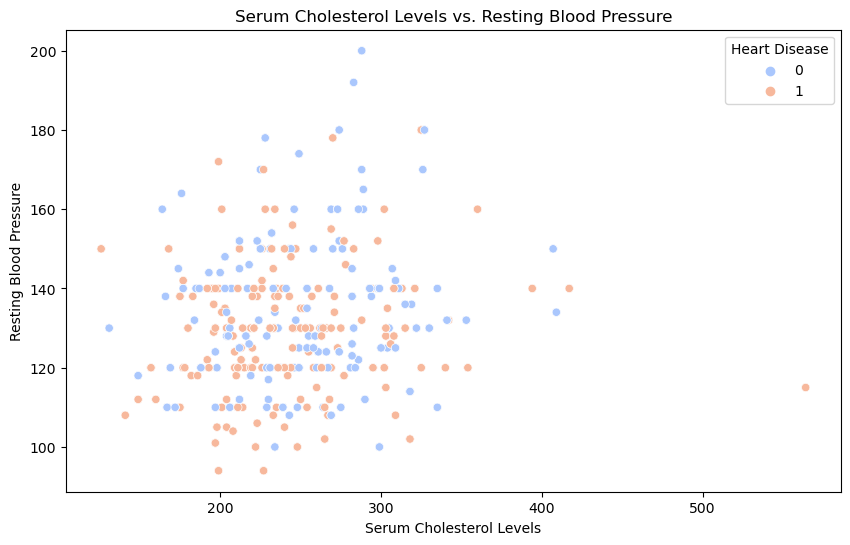

In [13]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=heart_df, x='chol', y='trestbps', hue='target', palette='coolwarm')
plt.title('Serum Cholesterol Levels vs. Resting Blood Pressure')
plt.xlabel('Serum Cholesterol Levels')
plt.ylabel('Resting Blood Pressure')
plt.legend(title='Heart Disease')
plt.show()


<h4><b>Chest Pain Type (cp) vs. Slope of the Peak Exercise ST Segment (slope)</h4>


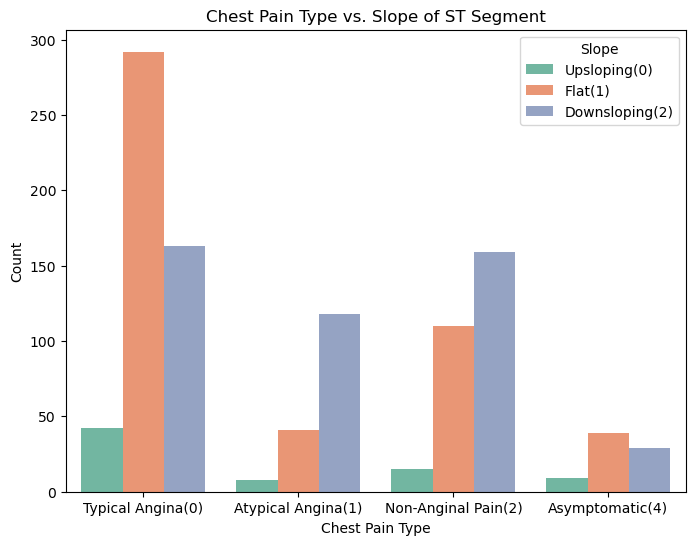

In [14]:
plt.figure(figsize=(8, 6))
sns.countplot(data=heart_df, x='cp', hue='slope', palette='Set2')
plt.title('Chest Pain Type vs. Slope of ST Segment')
plt.xlabel('Chest Pain Type')
plt.ylabel('Count')
plt.xticks([0, 1, 2, 3], ['Typical Angina(0)', 'Atypical Angina(1)', 'Non-Anginal Pain(2)', 'Asymptomatic(4)'])
plt.legend(title='Slope', labels=['Upsloping(0)', 'Flat(1)', 'Downsloping(2)'])
plt.show()


<em>  This plot shows certain chest pain types taht are more likely to be associated with specific slope types. For example, "Typical Angina(Class 0)" chest pain is commonly associated with a "Flat(Class 1)" slope. </em>

<h4><b>How does exercise-induced angina (exang) relate to heart disease presence or absence?</b></h4>

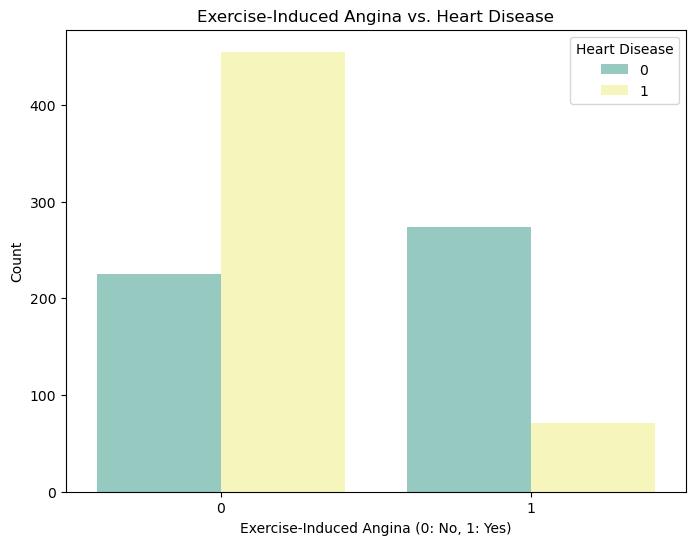

In [15]:
plt.figure(figsize=(8, 6))
sns.countplot(data=heart_df, x='exang', hue='target', palette='Set3')
plt.title('Exercise-Induced Angina vs. Heart Disease')
plt.xlabel('Exercise-Induced Angina (0: No, 1: Yes)')
plt.ylabel('Count')
plt.legend(title='Heart Disease')
plt.show()


<em>People without "Exercise-Angina" are more likely to get heart disease</em>


<h4><b>Resting Blood Pressure vs. Heart Disease </b></h4>

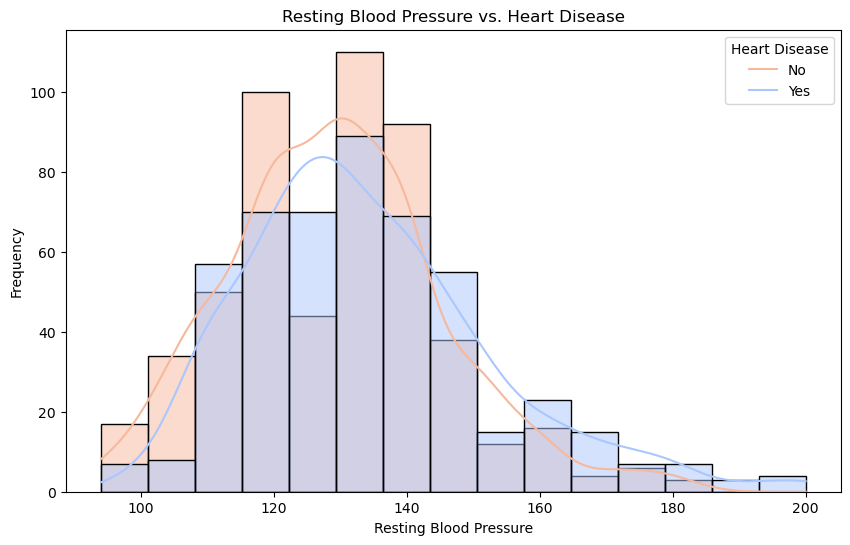

In [16]:
plt.figure(figsize=(10, 6))
sns.histplot(data=heart_df, x='trestbps', hue='target', bins=15, kde=True, palette='coolwarm')
plt.title('Resting Blood Pressure vs. Heart Disease')
plt.xlabel('Resting Blood Pressure')
plt.ylabel('Frequency')
plt.legend(title='Heart Disease', labels=['No', 'Yes'])
plt.show()


<Axes: >

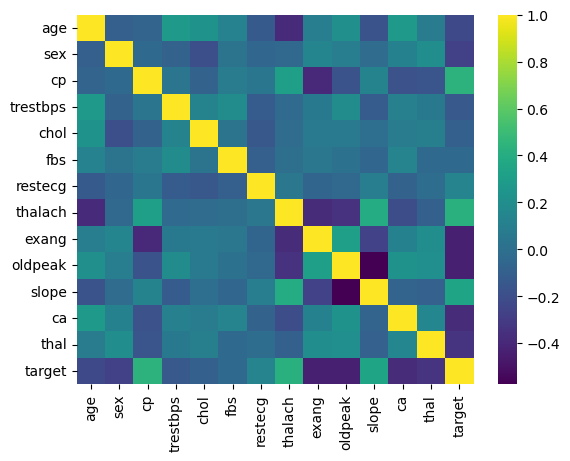

In [17]:
sns.heatmap(heart_df.corr(), cmap = 'viridis')

<h4><b> What is the age distribution of individuals with and without heart disease?</b></h4>

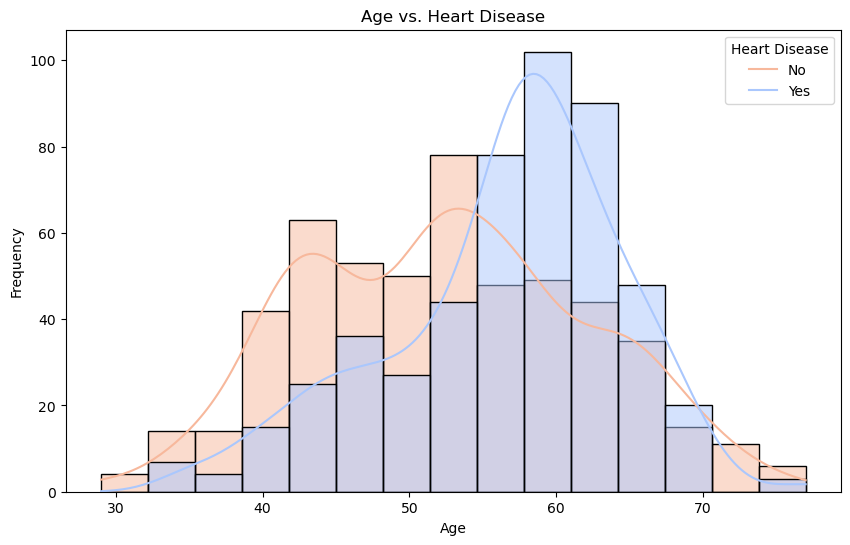

In [18]:
plt.figure(figsize=(10, 6))
sns.histplot(data=heart_df, x='age', hue='target', bins=15, kde=True, palette='coolwarm')
plt.title('Age vs. Heart Disease')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.legend(title='Heart Disease', labels=['No', 'Yes'])
plt.show()


<em>Conclusion: Has Age increases, it is more likely to Heart Disease</em>

<h4><b> Chest Pain Type vs Heart Disease</b></h4>

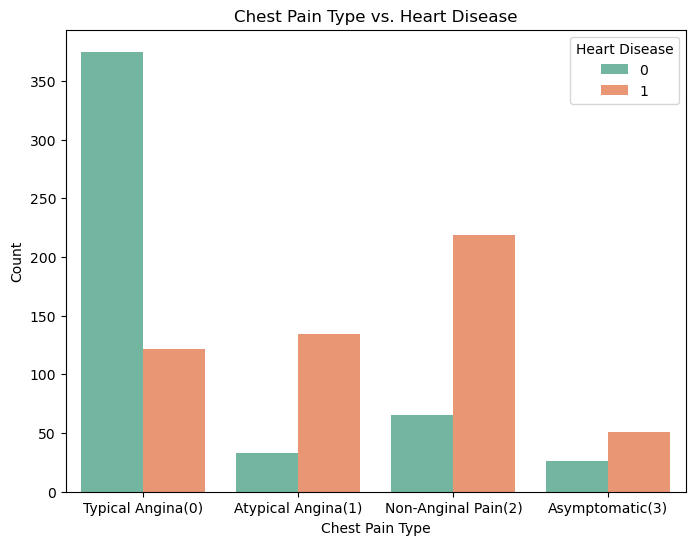

In [19]:
plt.figure(figsize=(8, 6))
sns.countplot(data=heart_df, x='cp', hue='target', palette='Set2')
plt.title('Chest Pain Type vs. Heart Disease')
plt.xlabel('Chest Pain Type')
plt.ylabel('Count')
plt.xticks([0, 1, 2, 3], ['Typical Angina(0)', 'Atypical Angina(1)', 'Non-Anginal Pain(2)', 'Asymptomatic(3)'])
plt.legend(title='Heart Disease')
plt.show()


<h4><b>Maximum Heart Rate vs Heart Disease</b></h4>

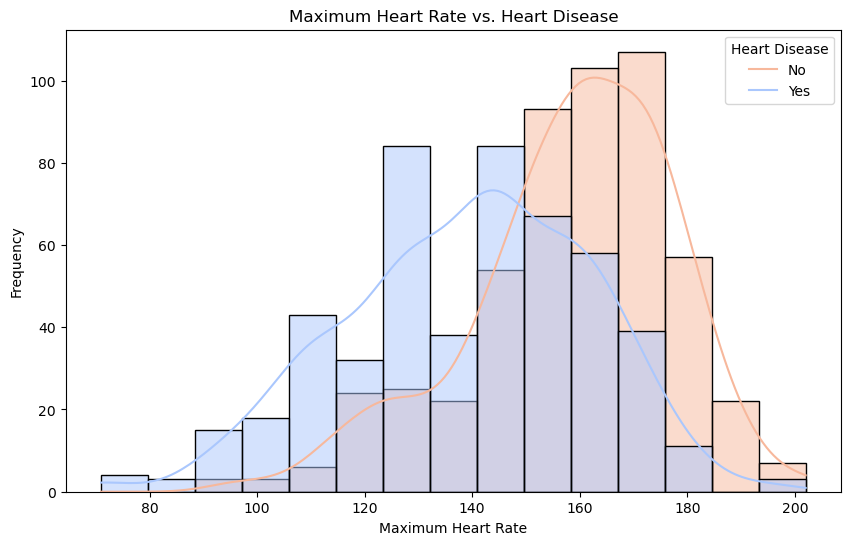

In [20]:
plt.figure(figsize=(10, 6))
sns.histplot(data=heart_df, x='thalach', hue='target', bins=15, kde=True, palette='coolwarm')
plt.title('Maximum Heart Rate vs. Heart Disease')
plt.xlabel('Maximum Heart Rate')
plt.ylabel('Frequency')
plt.legend(title='Heart Disease', labels=['No', 'Yes'])
plt.show()


<em>Conclusion: Increased Heart Rate leads to higher risk of Heart Disease</em>

<h4><b> Heatmap showing the relationship between Features and target variables</b></h4>

<Axes: >

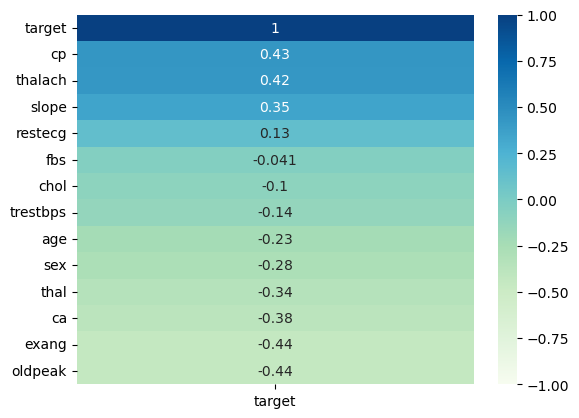

In [21]:
sns.heatmap(heart_df.corr()[['target']].sort_values(by='target', ascending=False), vmin=-1, vmax=1, annot=True, cmap='GnBu')

<h4><em>Model Selection</em></h4>

<img src="heart_result.PNG" alt="Heart Model Result">

<em> The model i'll be using for this heart data is RandomFOREST, Random forest has the highest recall score amongst the three algorithm used. Besides Randomforest is great for classification</em>

<br/>
<br/>


<br/>.
<br/>
<em>Lets work with Stroke Data</em>
<hr/>

In [22]:
stroke_feature = pd.read_csv('stroke_feature.csv')

In [23]:
stroke_feature.drop('Unnamed: 0', axis = 1, inplace = True)

<Axes: >

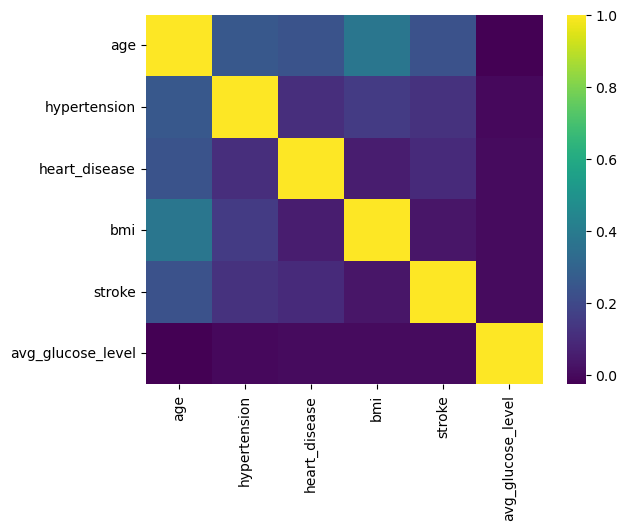

In [24]:
sns.heatmap(stroke_feature.corr(), cmap='viridis')

In [25]:
import ydata_profiling
stroke_feature.profile_report(title = "Stroke Disease Report")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [26]:
from scipy.stats import pearsonr

for i in stroke_feature.columns:
    if stroke_feature[i].dtype in ['int64', 'float64']:
        correlation_coefficient, _ = pearsonr(stroke_feature[i], stroke_feature['stroke'])
        print(f"{i}: {correlation_coefficient:.2f}")


age: 0.23
hypertension: 0.12
heart_disease: 0.10
bmi: 0.03
stroke: 1.00
avg_glucose_level: 0.00


In [27]:
stroke_feature.stroke.value_counts()

0    4120
1     165
Name: stroke, dtype: int64

<em>Relevant Questions to ask : </em>
<ol>
        <li>What is the distribution of the target variable (e.g., presence or absence of stroke?)</li> 
                <ul><li>In response to question 1, based on my analysis, there appears to be an uneven distribution between the two classes leadin to imbalance classes. It was balanced using undersampling and oversampling technique</li></ul><br/>
        <li>What are the statistical summaries of numerical features (e.g., age, hypertension, bmi) in relation to Stroke disease presence or absence?</li>   
                <ul><li>I analyze the numerical features in relation to Stroke disease presence or absence, I conducted the following statistical summaries for each relevant feature using the describe method</li></ul><br/>
        <li>Are there any correlations between numerical features and the target variable?</li>
                <ul>
                        <li>To determine correlations between numerical features and the target variable (stroke), I conducted correlation analysis using methods such as Pearson correlation coefficient or point-biserial correlation (for binary targets). Here are the key findings:      
                                <ul>
                                        <li>age :                0.23</li>
                                        <li>hypertension :        0.12</li>
                                        <li>heart_disease :         0.10</li>
                                        <li>bmi :                       0.03</li>
                                        <li>avg_glucose_level :       0.00</li>
                                </ul>
                        </li>
                </ul>
              <br/>
        </li>
        <li>
                How do categorical features (e.g., gender, chest pain type) relate to the presence or absence of heart disease?
                <ul><li>To assess the relationship between categorical features and the presence or absence of heart disease, I conducted chi-squared tests or contingency table analyses for each relevant categorical feature. You'll find graphs and plots below</li></ul>
        </li><br/>
        <li>
                More findings are presented in the graphs and plots below
        </li>
<ol>

<h4><b>Age vs Stroke</b></h4>

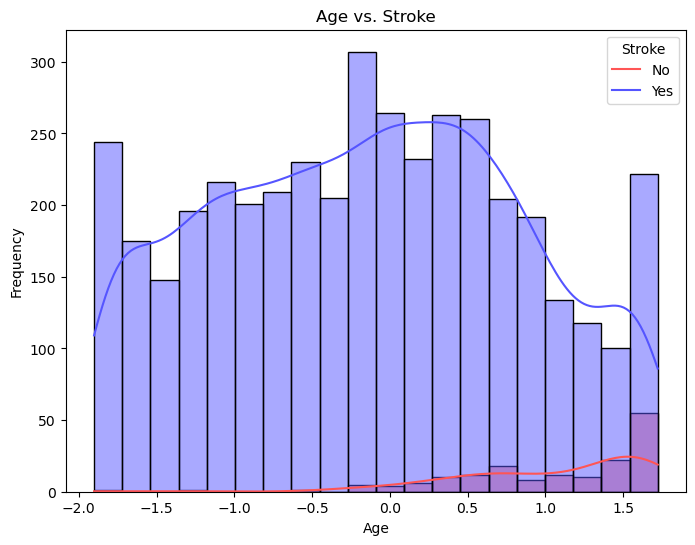

In [28]:

plt.figure(figsize=(8, 6))
sns.histplot(data=stroke_feature, x='age', hue='stroke', bins=20, kde=True, palette='seismic')
plt.title('Age vs. Stroke')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.legend(title='Stroke', labels=['No', 'Yes'])
plt.show()


<em>Conclusion: This histogram shows the age distribution for individuals with and without strokes. It aememears that strokes are more common in older individuals.</em>

<h4><b>Hypertension vs Stroke</b></h4>

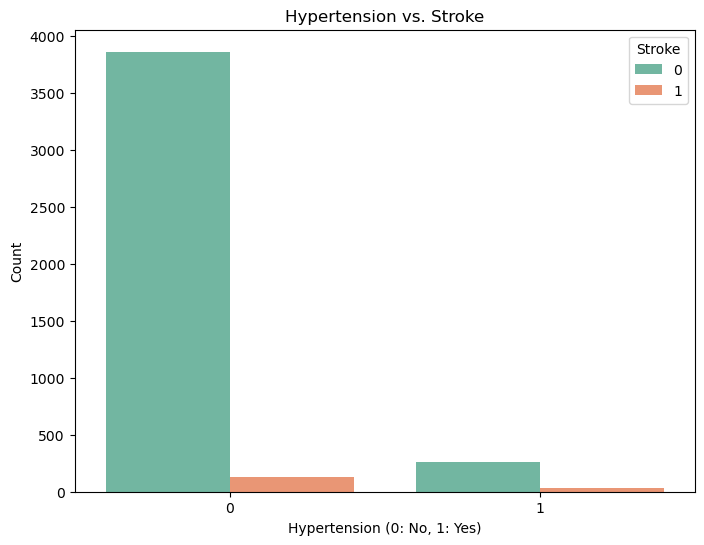

In [29]:
plt.figure(figsize=(8, 6))
sns.countplot(data=stroke_feature, x='hypertension', hue='stroke', palette='Set2')
plt.title('Hypertension vs. Stroke')
plt.xlabel('Hypertension (0: No, 1: Yes)')
plt.ylabel('Count')
plt.legend(title='Stroke')
plt.show()


<em>Conclusion: This countplot shows the distribution of stroke cases among individuals with and without hypertension. It suggests that individuals with hypertension may have a higher likelihood of experiencing a stroke</em>

<h4><b>Heart Disease vs Stroke</b></h4>

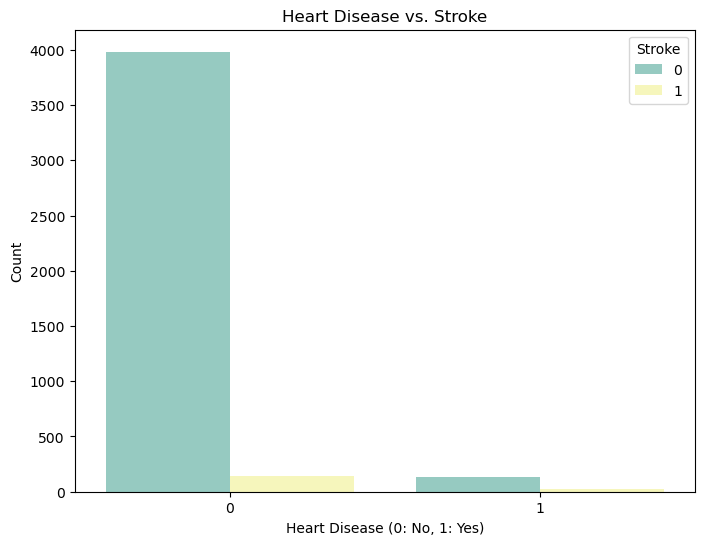

In [30]:
plt.figure(figsize=(8, 6))
sns.countplot(data=stroke_feature, x='heart_disease', hue='stroke', palette='Set3')
plt.title('Heart Disease vs. Stroke')
plt.xlabel('Heart Disease (0: No, 1: Yes)')
plt.ylabel('Count')
plt.legend(title='Stroke')
plt.show()


<em>Conclusion: This countplot shows the distribution of stroke cases among individuals with and without heart disease. It suggests that individuals with heart disease may have a higher likelihood of experiencing a stroke.</em>

<h4><b>BMI vs Stroke</b></h4>

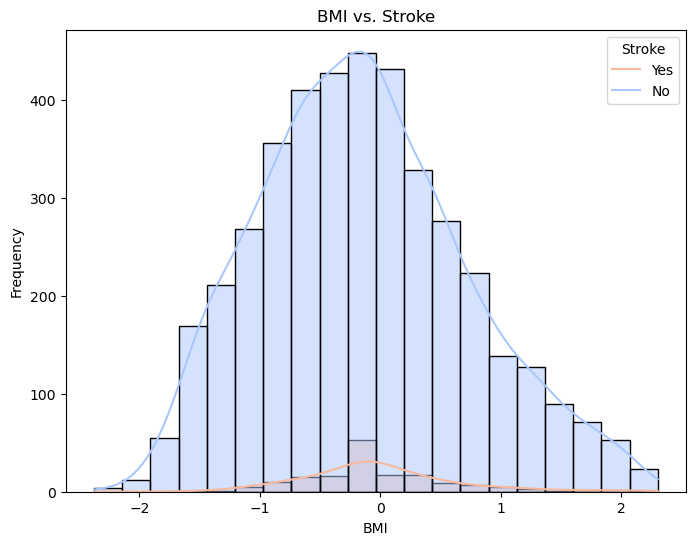

In [31]:
plt.figure(figsize=(8, 6))
sns.histplot(data=stroke_feature, x='bmi', hue='stroke', bins=20, kde=True, palette='coolwarm')
plt.title('BMI vs. Stroke')
plt.xlabel('BMI')
plt.ylabel('Frequency')
plt.legend(title='Stroke', labels=['Yes', 'No'])
plt.show()


<em>Conclusion: This histogram shows the BMI distribution for individuals with and without strokes. The distribution appears to be somewhat similar for both groups.</em>

<h4><b>Average Gluscose Level</b></h4>

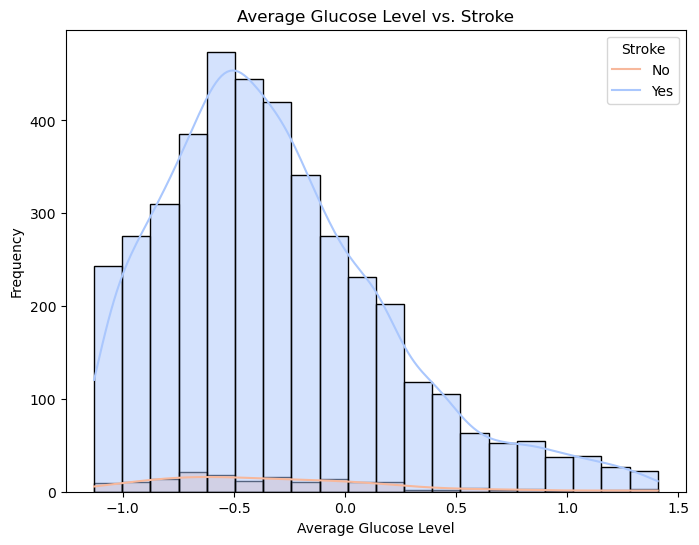

In [32]:
plt.figure(figsize=(8, 6))
sns.histplot(data=stroke_feature, x='avg_glucose_level', hue='stroke', bins=20, kde=True, palette='coolwarm')
plt.title('Average Glucose Level vs. Stroke')
plt.xlabel('Average Glucose Level')
plt.ylabel('Frequency')
plt.legend(title='Stroke', labels=['No', 'Yes'])
plt.show()


<em>Conclusion: This histogram shows the distribution of average glucose levels for individuals with and without strokes. It suggests that individuals with higher average glucose levels may have a higher likelihood of experiencing a stroke.</em>

<Axes: xlabel='stroke', ylabel='count'>

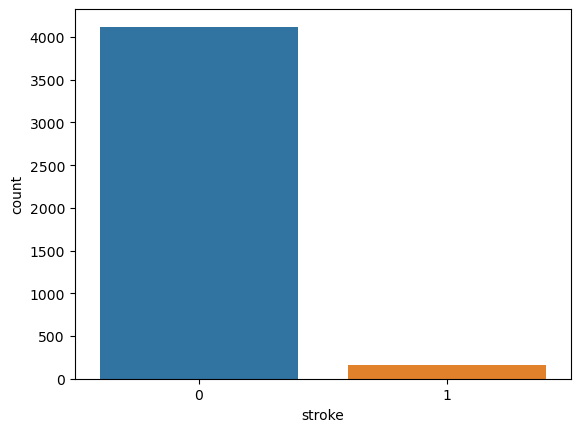

In [33]:
sns.countplot(stroke_feature, x = 'stroke')

<h4><b> Heatmap showing the relationship between Features and target variables</b></h4>

<Axes: >

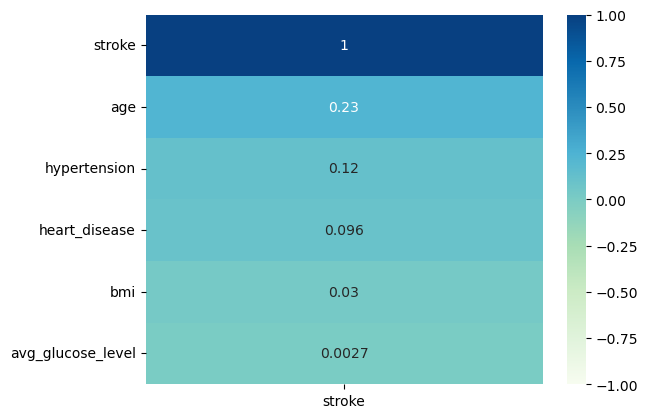

In [34]:
sns.heatmap(stroke_feature.corr()[['stroke']].sort_values(by='stroke', ascending=False), vmin=-1, vmax=1, annot=True, cmap='GnBu')

<h3><b> Model Selection </b></h3>

<img src="stroke_result.PNG" alt="Stroke Model Result">

<em> Based off the image above, 3 models were used the most accurate being Decision tree and Random Forest. Workings will be shown in next Phase....</em>

<br/>
<br/>
<br/>
<br/>
<br/>
<em> Lastly, Lungs Data</em>

In [35]:
lung_feature = pd.read_csv('lung_feature.csv')

In [36]:
lung_feature.drop('Unnamed: 0', axis=1, inplace=True)

In [37]:
lung_feature.columns

Index(['Obesity', 'Coughing of Blood', 'Passive Smoker', 'Alcohol use',
       'Dust Allergy', 'Genetic Risk', 'Level'],
      dtype='object')

<Axes: >

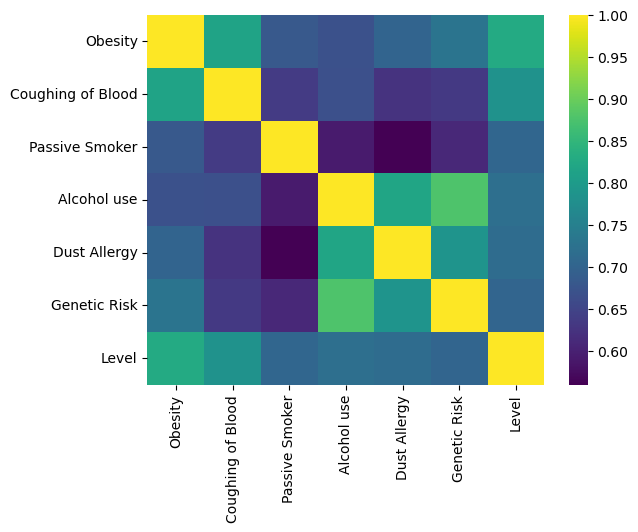

In [38]:
sns.heatmap(lung_feature.corr(), cmap = 'viridis')

In [39]:
import ydata_profiling
lung_feature.profile_report(title = "Lung Cancer Report")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [40]:
from scipy.stats import pearsonr

for i in lung_feature.columns:
    if lung_feature[i].dtype in ['int64', 'float64']:
        correlation_coefficient, _ = pearsonr(lung_feature[i], lung_feature['Level'])
        print(f"{i}: {correlation_coefficient:.2f}")


Obesity: 0.83
Coughing of Blood: 0.78
Passive Smoker: 0.70
Alcohol use: 0.72
Dust Allergy: 0.71
Genetic Risk: 0.70
Level: 1.00


<em>Relevant Questions to ask : </em>
<ol>
        <li>What is the distribution of the target variable (e.g., presence or absence of Lung Cancer?)</li> 
                <ul><li>In response to question 1, based on my analysis, there appears to be a relatively even distribution between the three classes</li></ul><br/>
        <li>What are the statistical summaries of numerical features (e.g., obesity, alcohol use, genetic risk) in relation to heart disease presence or absence?</li>   
                <ul><li>I analyze the numerical features in relation to Lung Cancer presence or absence, I conducted the following statistical summaries for each relevant feature using the describe method</li></ul><br/>
        <li>Are there any correlations between numerical features and the target variable?</li>
                <ul>
                        <li>To determine correlations between numerical features and the target variable (Level), I conducted correlation analysis using methods such as Pearson correlation coefficient. Here are the key findings:      
                                <ul>
                                        <li>Obesity :                0.83</li>
                                        <li>Coughing of Blood :        0.78</li>
                                        <li>Passive Smoker :         0.70</li>
                                        <li>Alcohol use :                       0.72</li>
                                        <li>Dust Allergy :       0.71</li>
                                        <li>Genetic Risk:       0.70</li>
                                </ul>
                        </li>
                </ul>
              <br/>
        </li>
        <li>
                How do categorical features relate to the presence or absence of heart disease?
                <ul><li>According to pandas-profiling, there is only one categorical variable which is Level(target variable)</li></ul>
        </li><br/>
        <li>
                More findings are presented in the graphs and plots below
        </li>
<ol>

<h4><b>Obesity vs Level</b></h4>

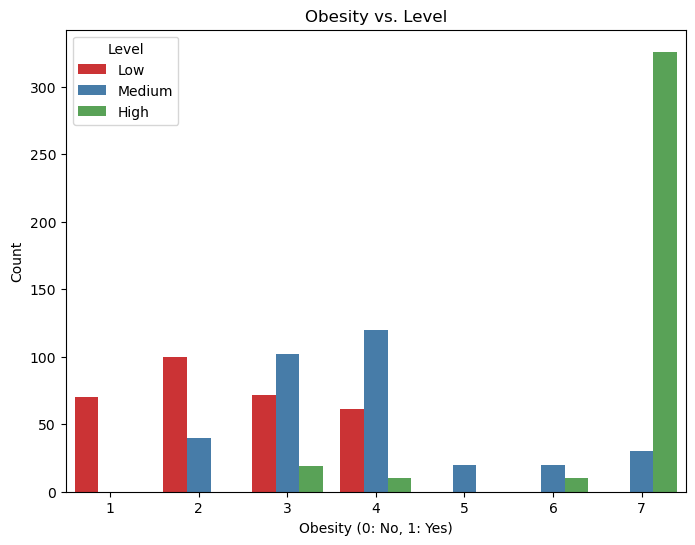

In [41]:
plt.figure(figsize=(8, 6))
sns.countplot(data=lung_feature, x='Obesity', hue='Level', palette='Set1')
plt.title('Obesity vs. Level')
plt.xlabel('Obesity (0: No, 1: Yes)')
plt.ylabel('Count')
plt.legend(title='Level', labels=['Low', 'Medium', 'High'])
plt.show()


<em>Conclusion: This countplot shows the distribution of 'Level' among individuals with and without obesity. It provides shows if obesity is associated with different levels of lung cancer risk.</em>

<h4><b>Coughing of Blood vs Level </b></h4>

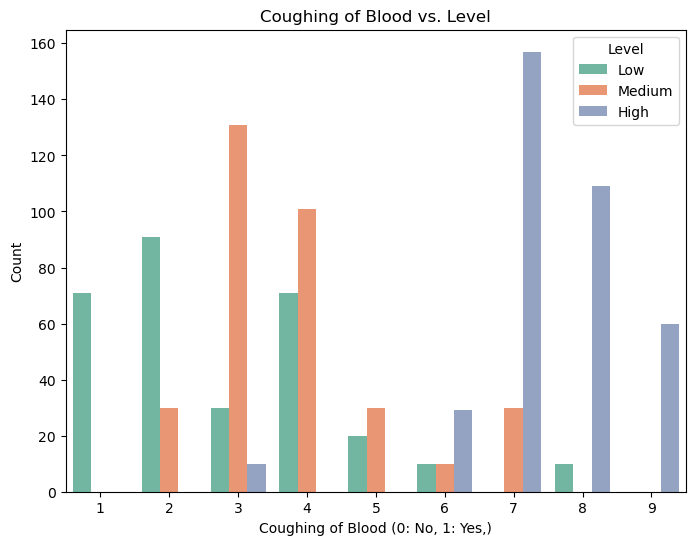

In [42]:
plt.figure(figsize=(8, 6))
sns.countplot(data=lung_feature, x='Coughing of Blood', hue='Level', palette='Set2')
plt.title('Coughing of Blood vs. Level')
plt.xlabel('Coughing of Blood (0: No, 1: Yes,)')
plt.ylabel('Count')
plt.legend(title='Level', labels=['Low', 'Medium', 'High'])
plt.show()


<em>Conclusion: This countplot shows the distribution of 'Level' among individuals with and without a history of coughing blood. It helps to assess the relationship between this symptom and lung cancer risk.</em>

<h4><b>Passive Smoker vs. Level</b></h4>

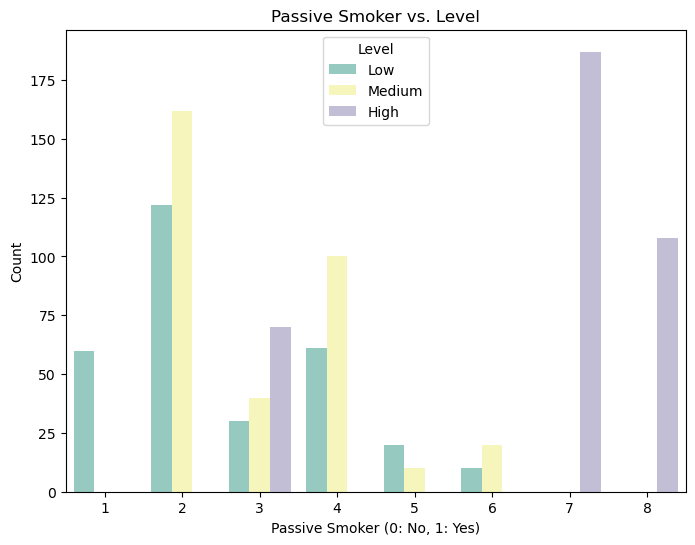

In [43]:
plt.figure(figsize=(8, 6))
sns.countplot(data=lung_feature, x='Passive Smoker', hue='Level', palette='Set3')
plt.title('Passive Smoker vs. Level')
plt.xlabel('Passive Smoker (0: No, 1: Yes)')
plt.ylabel('Count')
plt.legend(title='Level', labels=['Low', 'Medium', 'High'])
plt.show()


<h4><b> Heatmap showing the relationship between Features and target variables</b></h4>

<Axes: >

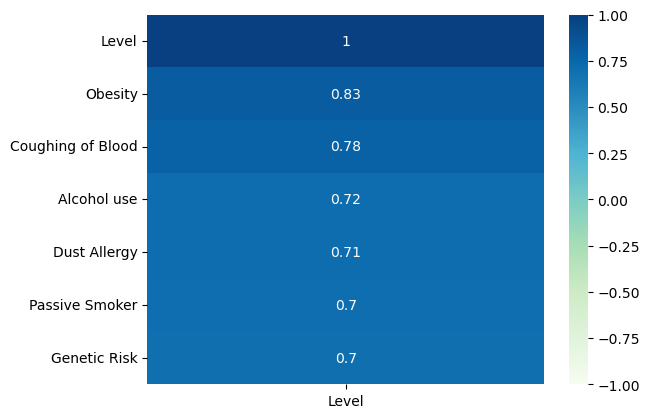

In [44]:
sns.heatmap(lung_feature.corr()[['Level']].sort_values(by='Level', ascending=False), vmin=-1, vmax=1, annot=True, cmap='GnBu')

<h3><b>Model Selection</b></h3>

<img src="lung_result.PNG" alt="Lung Result">


<em> According to the image above, Decision Tree,SVC and Random Forest were used to test and evaluate model, Random Forest and Decision Tree being the highest with 100% Recall.
workings will be shown in the next phase</em>

<br/>
<br/>
<h3><b>Overall Model Selection - Random Forest </b></h3>
<hr/>

The Random Forest Classifier is a popular machine learning algorithm used for both classification and regression tasks. It is an ensemble learning method, which means it combines the predictions of multiple individual machine learning models to make more accurate and robust predictions. Here's an overview of the Random Forest Classifier and its benefits:

**Random Forest Classifier:**
- **Ensemble Method:** It is an ensemble of decision trees, where each tree is trained on a random subset of the data and a random subset of the features (known as bagging and feature randomization).
- **Majority Voting:** For classification tasks, it combines the predictions of individual trees by majority voting, meaning the class with the most votes is the final prediction.
- **Regression:** It can also be used for regression tasks by averaging the outputs of individual trees.

**Benefits of Random Forest:**

1. **High Accuracy:** Random Forest tends to provide high accuracy in both classification and regression tasks. It's less prone to overfitting compared to a single decision tree.

2. **Robustness:** It's robust to outliers and noisy data due to the combination of multiple trees. Outliers may not have a significant impact on the overall prediction.

3. **Handles Missing Values:** It can handle missing values in the dataset without the need for imputation.

4. **Feature Importance:** Random Forest provides a measure of feature importance, which helps in feature selection and understanding which features are most influential.

5. **Reduced Risk of Overfitting:** By averaging or voting over multiple trees, it reduces the risk of overfitting, making it less sensitive to noise in the data.

**Strengths of Random Forest:**

1. **Versatility:** It can be applied to both classification and regression problems, making it versatile for various tasks.

2. **Parallelization:** Training individual decision trees can be done in parallel, making it efficient for large datasets.

3. **Implicit Feature Selection:** It naturally selects the most important features by assessing their contribution to the decision trees.

4. **Reduced Variance:** The combination of multiple trees reduces the variance of the model, leading to more stable predictions.

**Why it's commonly used:**

Random Forest is commonly used in various applications for several reasons:

- It provides high accuracy and robustness.
- It handles a wide range of data types, including categorical and numerical features.
- It can be used for feature selection.
- It's less sensitive to hyperparameters compared to some other algorithms.
- It's relatively easy to implement and less prone to overfitting.
- It's a powerful tool for both beginners and experienced data scientists due to its effectiveness and versatility.

Overall, Random Forest is a go-to algorithm in many machine learning projects because of its strong performance and ability to handle complex and noisy datasets.